In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from torchvision.models import resnet50, ResNet50_Weights
from torch.utils.data import DataLoader, Sampler
from AdaIN import AdaIN

In [2]:
style_path = "style/sketch.png"
prebuildEncoder = "vgg.pth"
prebuildDecoder = "decoder-adain.pth"
image_path = "content/avril.jpg"

print(resnet50(weights=ResNet50_Weights.DEFAULT))

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [3]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(256),
    transforms.ToTensor()
])

#coco content
train_content_dataset = datasets.ImageFolder(
    root= "../coco",             
    transform=transform
)

#wikiart
train_style_dataset = datasets.ImageFolder(
    root= "../archive",             
    transform=transform
)

train_content_loader = DataLoader(train_content_dataset, batch_size=1, shuffle=True)
train_style_loader = DataLoader(train_style_dataset, batch_size=1, shuffle=True)


In [4]:
resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
encoder = nn.Sequential(*list(resnet.children())[:6])

In [5]:
#Training completed
# defaultModel = AdaIN()
# defaultModel.uploadEncoder(encoder)
# defaultModel.epochTraining(train_content_loader, train_style_loader, "res50_default", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0)
# defaultModel.fit(image_path,[style_path])
# defaultModel.pipeline()
# defaultModel.displayImages()
# defaultModel.evaluate()

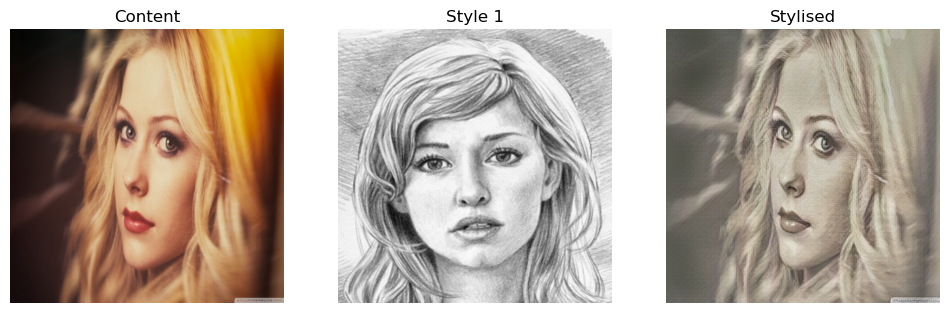

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


(0.552, 190.727583001717)

In [6]:
defaultModel = AdaIN(prebuild_decoder = "res50_default_5.pth")
defaultModel.uploadEncoder(encoder)
defaultModel.setup()
defaultModel.fit(image_path,[style_path])
defaultModel.pipeline()
defaultModel.displayImages()
defaultModel.evaluate()

In [7]:
#Parameter to Train
style_w= [5.0, 10.0, 30.0]
content_w= [1.0, 5.0, 10.0]

# Training Complete
# for cw in content_w:
#     for sw in style_w:
#         print(f"Training at content: {cw} and style: {sw}")
#         model = AdaIN()
#         model.uploadEncoder(encoder)
#         model.epochTraining(train_content_loader, train_style_loader, f"res50_{int(cw)}_{int(sw)}", steps = 20000, epoch = 5, style_weight = sw, content_weight=cw)
#         model.fit(image_path,[style_path])
#         model.pipeline()
#         model.displayImages()
        

content: 1.0 and style: 5.0


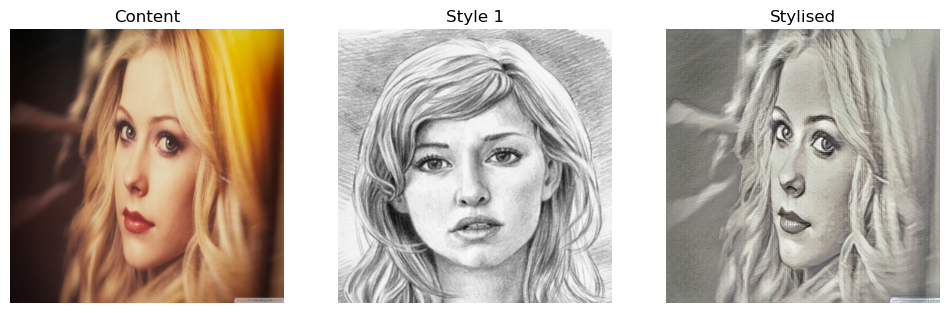

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.639, 80.32141700095963)
content: 1.0 and style: 10.0


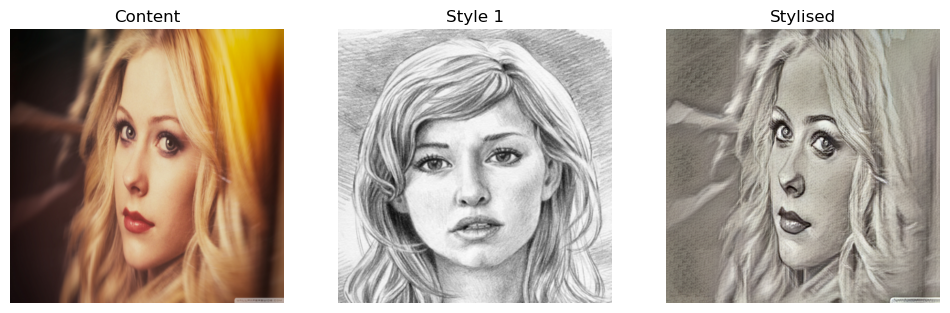

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.632, 78.68674999917857)
content: 1.0 and style: 30.0


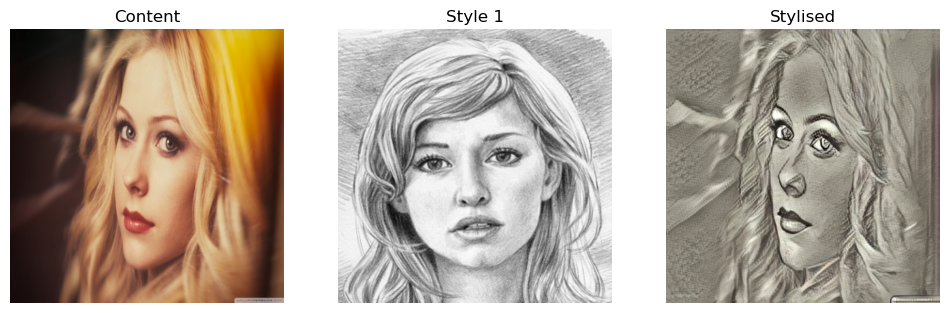

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.733, 77.54720899902168)
content: 5.0 and style: 5.0


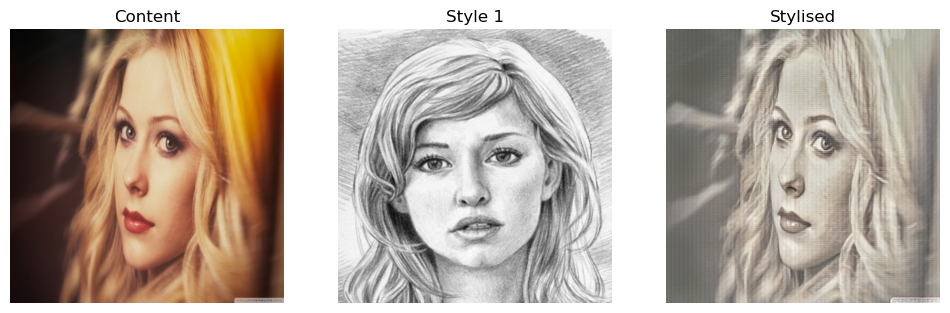

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.585, 80.66191699981573)
content: 5.0 and style: 10.0


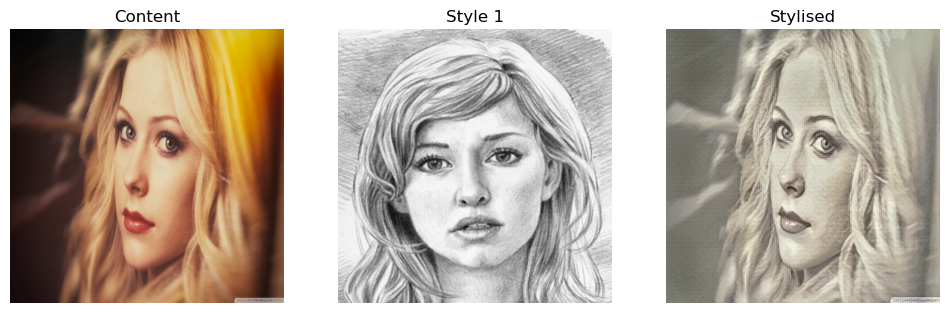

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.576, 79.44858300106716)
content: 5.0 and style: 30.0


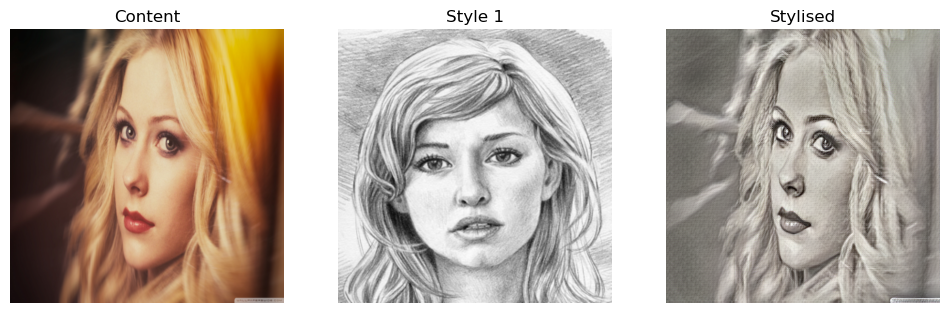

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.625, 80.5556669984071)
content: 10.0 and style: 5.0


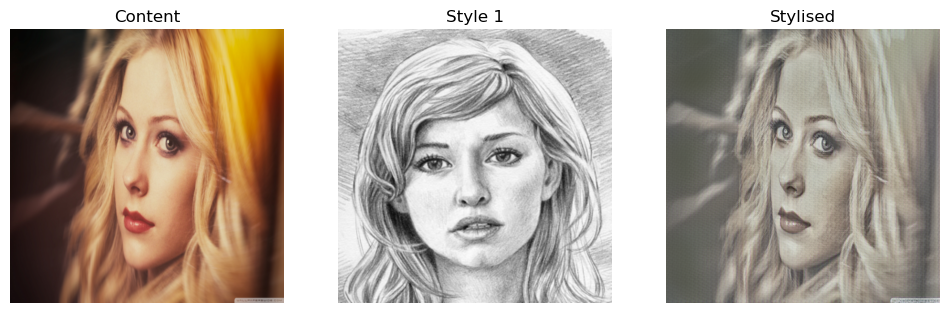

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.535, 79.32620900101028)
content: 10.0 and style: 10.0


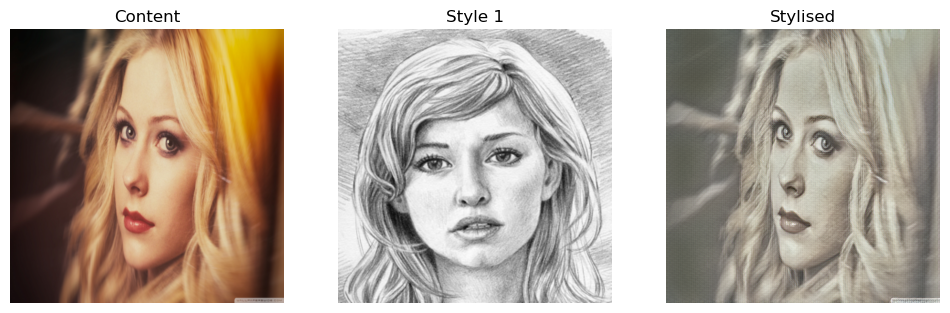

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.561, 81.3131249997241)
content: 10.0 and style: 30.0


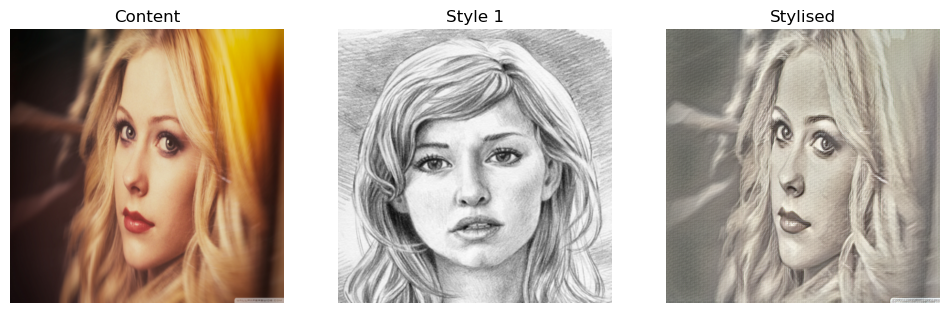

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.595, 81.2941249969299)


In [8]:
for cw in content_w:
    for sw in style_w:
        print(f"content: {cw} and style: {sw}")
        model = AdaIN(prebuild_decoder = f"res50_{int(cw)}_{int(sw)}_5.pth")
        model.uploadEncoder(encoder)
        model.setup()
        model.fit(image_path,[style_path])
        model.pipeline()
        model.displayImages()
        print(model.evaluate())

In [9]:
#Training Complete
# lowLRModel = AdaIN()
# lowLRModel.uploadEncoder(encoder)
# lowLRModel.epochTraining(train_content_loader, train_style_loader, "res50_lowLR", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0, learn_rate = 1e-5)
# lowLRModel.fit(image_path,[style_path])
# lowLRModel.pipeline()
# lowLRModel.displayImages()
# lowLRModel.evaluate()

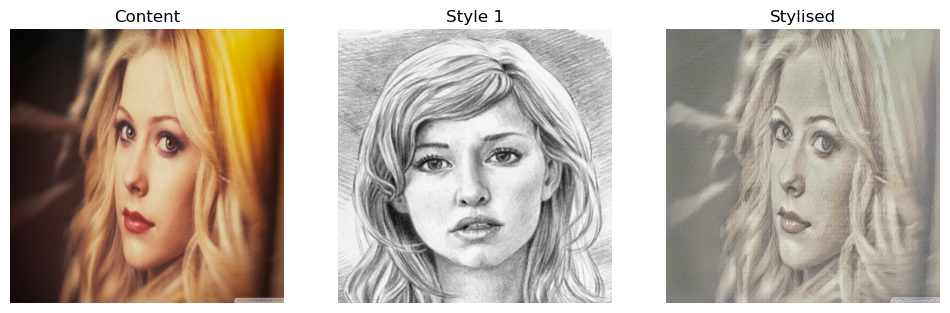

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.594, 80.64575000025798)

In [10]:
lowLRModel = AdaIN(prebuild_decoder = f"res50_lowLR_5.pth")
lowLRModel.uploadEncoder(encoder)
lowLRModel.setup()
lowLRModel.fit(image_path,[style_path])
lowLRModel.pipeline()
lowLRModel.displayImages()
lowLRModel.evaluate()

In [11]:
#Training Complete
# highLRModel = AdaIN()
# highLRModel.uploadEncoder(encoder)
# highLRModel.epochTraining(train_content_loader, train_style_loader, "res50_highLR", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0, learn_rate = 1e-3)
# highLRModel.fit(image_path,[style_path])
# highLRModel.pipeline()
# highLRModel.displayImages()
# highLRModel.evaluate()

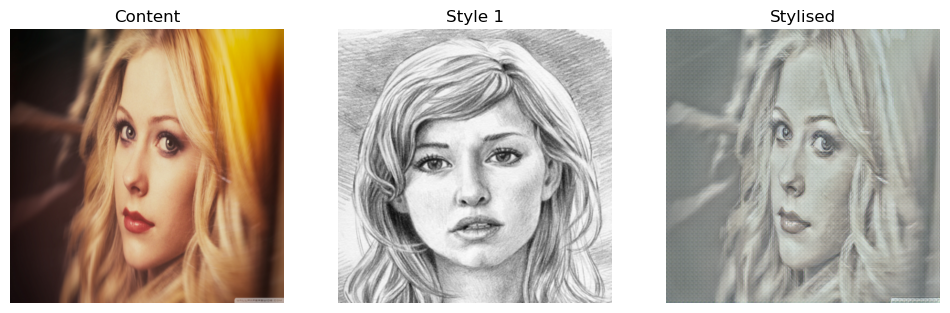

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.644, 79.33445800154004)

In [12]:
highLRModel = AdaIN(prebuild_decoder = f"res50_highLR_5.pth")
highLRModel.uploadEncoder(encoder)
highLRModel.setup()
highLRModel.fit(image_path,[style_path])
highLRModel.pipeline()
highLRModel.displayImages()
highLRModel.evaluate()

In [13]:
children = list(resnet.children())
bottleneck3_1 = children[6][0]
encoder3_1 = nn.Sequential(*children[:6], *list(bottleneck3_1.children())[:7]) #relu3-1

#Training Complete
# model3_1 = AdaIN()
# model3_1.uploadEncoder(encoder3_1)
# model3_1.uploadDecoder(model3_1.vggDecoder(1024))
# model3_1.epochTraining(train_content_loader, train_style_loader, "res50_3_1", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0)
# model3_1.fit(image_path,[style_path])
# model3_1.pipeline()
# model3_1.displayImages()
# model3_1.evaluate()

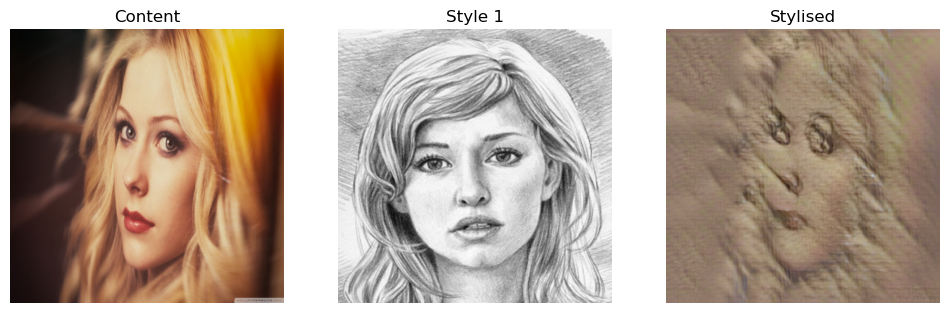

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.718, 66.93816700135358)

In [14]:
model3_1 = AdaIN(prebuild_decoder = f"res50_3_1_5.pth")
model3_1.uploadEncoder(encoder3_1)
model3_1.uploadDecoder(model3_1.vggDecoder(1024))
model3_1.setup()
model3_1.fit(image_path,[style_path])
model3_1.pipeline()
model3_1.displayImages()
model3_1.evaluate()

In [15]:
bottleneck2_3 = children[5]
encoder2_3 = nn.Sequential(*children[:5], *list(bottleneck2_3.children())[:3]) #relu2-3


#Training Complete
# model2_3 = AdaIN()
# model2_3.uploadEncoder(encoder2_3)
# model2_3.epochTraining(train_content_loader, train_style_loader, "res50_2_3", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0)
# model2_3.fit(image_path,[style_path])
# model2_3.pipeline()
# model2_3.displayImages()
# model2_3.evaluate()

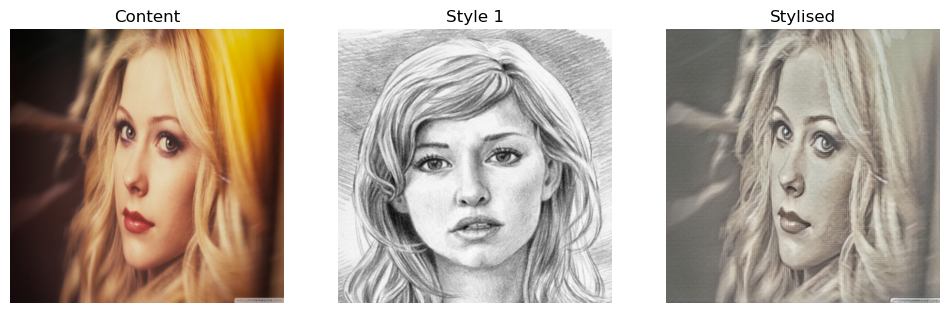

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.566, 77.91954099957366)

In [16]:
model2_3 = AdaIN(prebuild_decoder = f"res50_2_3_5.pth")
model2_3.uploadEncoder(encoder2_3)
model2_3.setup()
model2_3.fit(image_path,[style_path])
model2_3.pipeline()
model2_3.displayImages()
model2_3.evaluate()

In [17]:
#Parameter to Train
style_w= [5.0, 10.0, 30.0]
content_w= [1.0, 5.0, 10.0]


# Training Complete
# for cw in content_w:
#     for sw in style_w:
#         print(f"Training at content: {cw} and style: {sw}")
#         model = AdaIN()
#         model.uploadEncoder(encoder2_3)
#         model.epochTraining(train_content_loader, train_style_loader, f"res50_2_3_{int(cw)}_{int(sw)}", steps = 20000, epoch = 5, style_weight = sw, content_weight=cw)
#         model.fit(image_path,[style_path])
#         model.pipeline()
#         model.displayImages()

content: 1.0 and style: 5.0


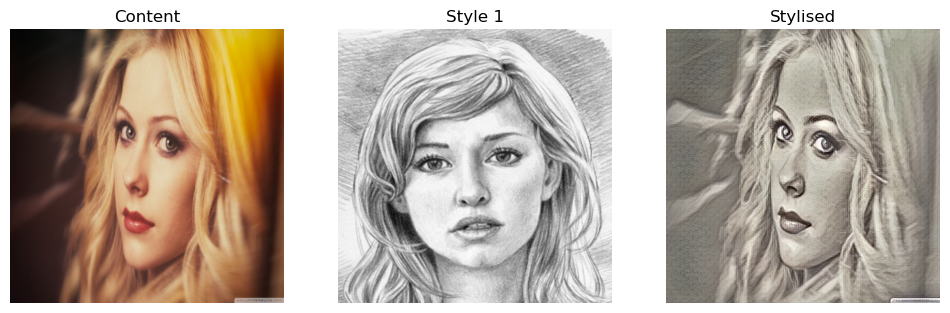

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.628, 81.06354199844645)
content: 1.0 and style: 10.0


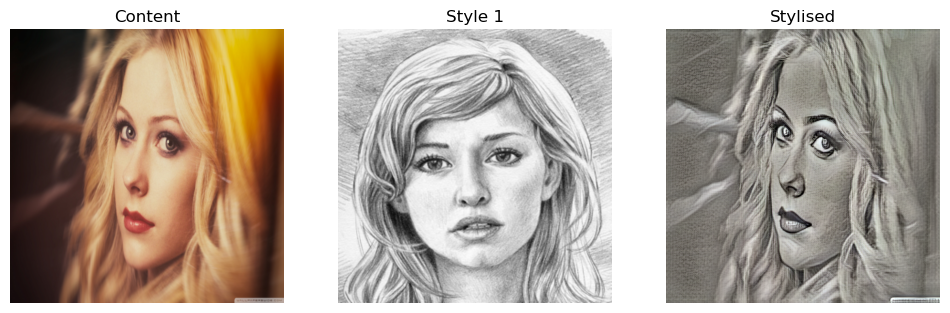

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.658, 78.08612500230083)
content: 1.0 and style: 30.0


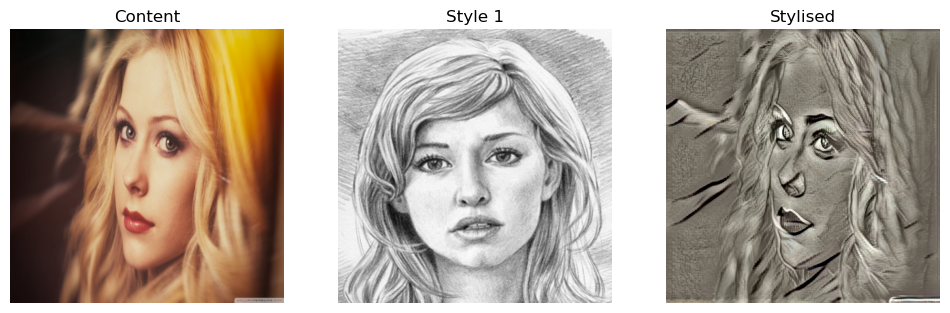

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.723, 77.500625000539)
content: 5.0 and style: 5.0


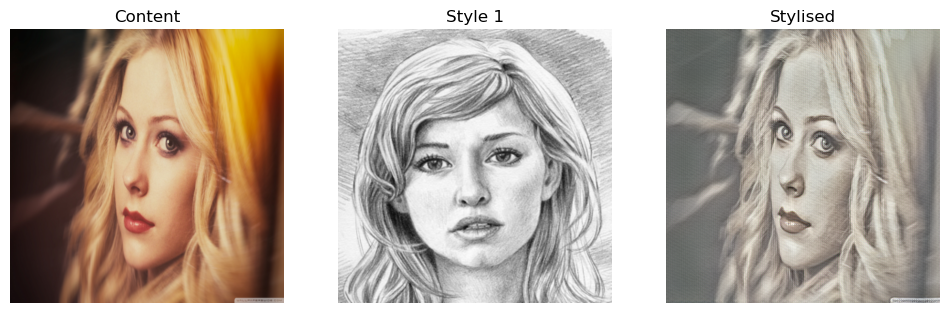

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.581, 79.43075000002864)
content: 5.0 and style: 10.0


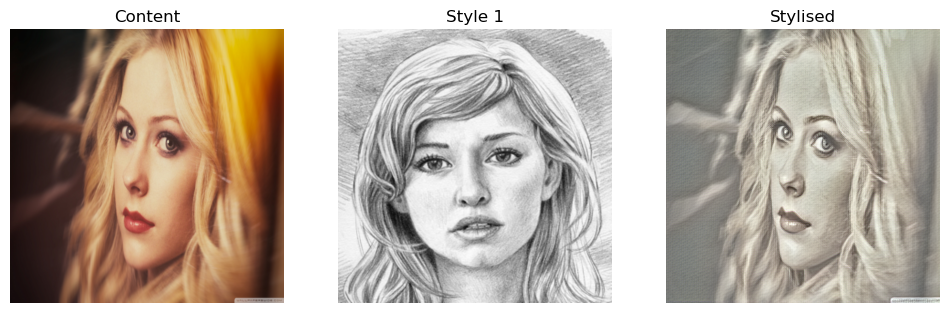

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.573, 77.55383400217397)
content: 5.0 and style: 30.0


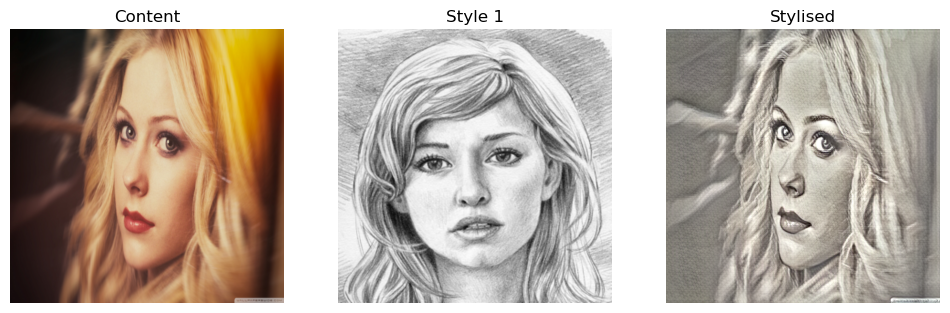

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.661, 79.09733400083496)
content: 10.0 and style: 5.0


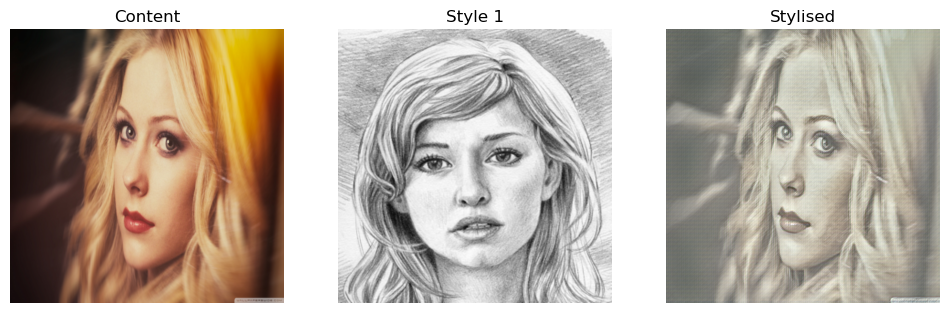

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.633, 78.338374998566)
content: 10.0 and style: 10.0


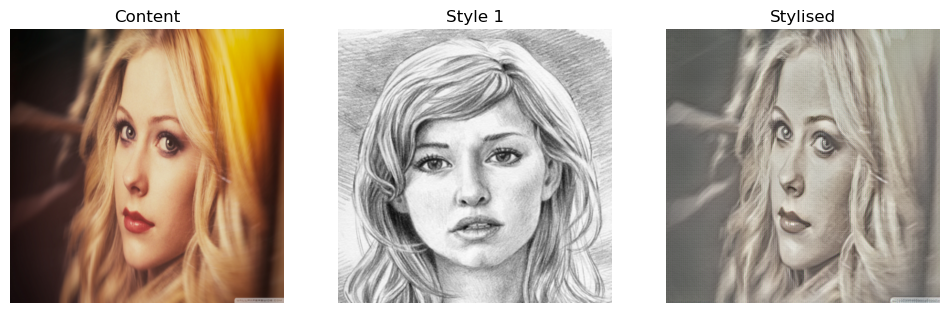

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.539, 79.6598749984696)
content: 10.0 and style: 30.0


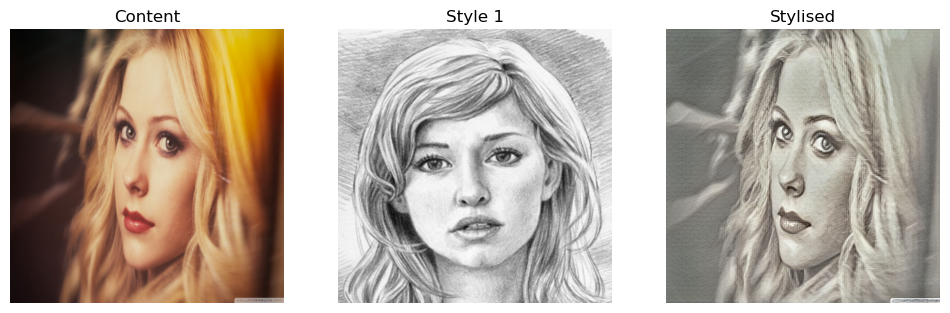

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.611, 77.71783399948617)


In [18]:
for cw in content_w:
    for sw in style_w:
        print(f"content: {cw} and style: {sw}")
        model = AdaIN(prebuild_decoder = f"res50_2_3_{int(cw)}_{int(sw)}_5.pth")
        model.uploadEncoder(encoder2_3)
        model.setup()
        model.fit(image_path,[style_path])
        model.pipeline()
        model.displayImages()
        print(model.evaluate())

Training at content: 1.0 and style: 40.0
Epoch: 1
[1000/20000] content=1.2586 style=5.9706 total=7.229209
[2000/20000] content=1.1968 style=3.3468 total=4.543576
[3000/20000] content=1.1819 style=2.8431 total=4.024962
[4000/20000] content=1.1643 style=2.5505 total=3.714760
[5000/20000] content=1.1648 style=2.5023 total=3.667085
[6000/20000] content=1.1431 style=2.2476 total=3.390634
[7000/20000] content=1.1292 style=2.1286 total=3.257791
[8000/20000] content=1.1256 style=2.0536 total=3.179141
[9000/20000] content=1.1284 style=2.0643 total=3.192727
[10000/20000] content=1.1097 style=2.0263 total=3.135993
[11000/20000] content=1.1107 style=2.0027 total=3.113446
[12000/20000] content=1.0904 style=1.8925 total=2.982890
[13000/20000] content=1.0984 style=1.9126 total=3.011049
[14000/20000] content=1.0786 style=1.7771 total=2.855642
[15000/20000] content=1.0767 style=1.7384 total=2.815088
[16000/20000] content=1.0606 style=1.7092 total=2.769741
[17000/20000] content=1.0766 style=1.7958 total

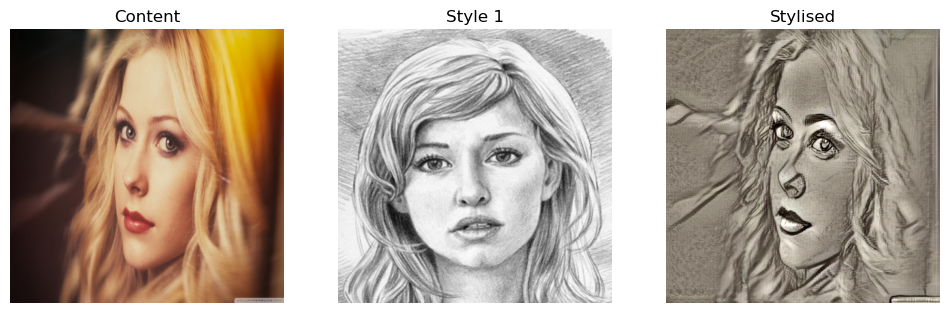

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.722, 127.23475000530016)
Training at content: 1.0 and style: 50.0
Epoch: 1
[1000/20000] content=1.2492 style=7.2060 total=8.455269
[2000/20000] content=1.2150 style=3.8755 total=5.090428
[3000/20000] content=1.1965 style=3.3521 total=4.548556
[4000/20000] content=1.1819 style=3.0395 total=4.221331
[5000/20000] content=1.1855 style=3.0124 total=4.197833
[6000/20000] content=1.1589 style=2.7893 total=3.948268
[7000/20000] content=1.1564 style=2.6124 total=3.768763
[8000/20000] content=1.1572 style=2.6097 total=3.766931
[9000/20000] content=1.1369 style=2.4657 total=3.602649
[10000/20000] content=1.1324 style=2.3516 total=3.483960
[11000/20000] content=1.1257 style=2.2723 total=3.398013
[12000/20000] content=1.1144 style=2.2731 total=3.387502
[13000/20000] content=1.1050 style=2.2748 total=3.379776
[14000/20000] content=1.09

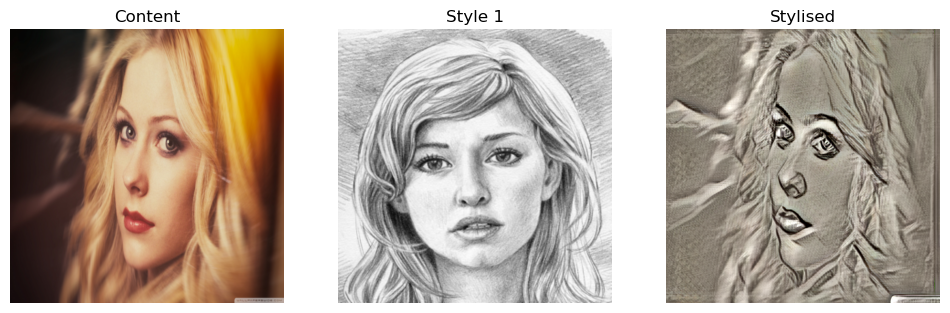

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.736, 2588.696416001767)
Training at content: 2.0 and style: 40.0
Epoch: 1
[1000/20000] content=2.4212 style=5.8118 total=8.232992
[2000/20000] content=2.2832 style=3.3203 total=5.603515
[3000/20000] content=2.1800 style=2.8304 total=5.010389
[4000/20000] content=2.1224 style=2.6019 total=4.724364
[5000/20000] content=2.0699 style=2.4304 total=4.500301
[6000/20000] content=2.0112 style=2.3212 total=4.332448
[7000/20000] content=1.9854 style=2.1593 total=4.144749
[8000/20000] content=1.9806 style=2.2126 total=4.193227
[9000/20000] content=1.8903 style=2.0345 total=3.924811
[10000/20000] content=1.8654 style=1.9727 total=3.838032
[11000/20000] content=1.8372 style=1.9612 total=3.798338
[12000/20000] content=1.8222 style=1.9506 total=3.772841
[13000/20000] content=1.7620 style=1.7463 total=3.508335
[14000/20000] content=1.782

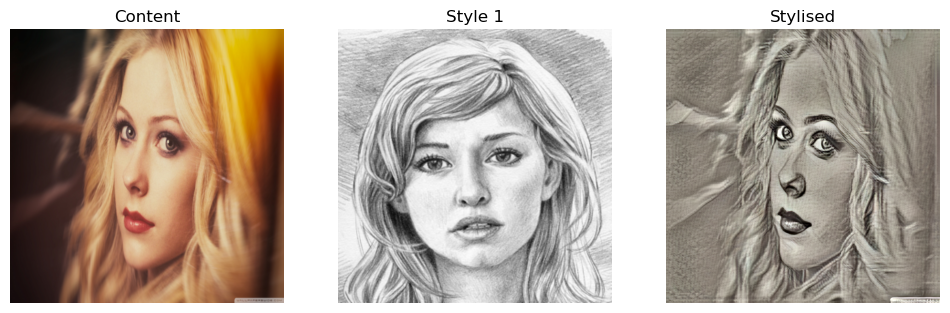

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.702, 3532.5579999989714)
Training at content: 2.0 and style: 50.0
Epoch: 1
[1000/20000] content=2.4912 style=7.2643 total=9.755465
[2000/20000] content=2.3706 style=3.9358 total=6.306350
[3000/20000] content=2.2909 style=3.3937 total=5.684552
[4000/20000] content=2.2333 style=3.0979 total=5.331205
[5000/20000] content=2.2051 style=3.0413 total=5.246338
[6000/20000] content=2.1339 style=2.9492 total=5.083103
[7000/20000] content=2.1187 style=2.7064 total=4.825140
[8000/20000] content=2.0681 style=2.6111 total=4.679185
[9000/20000] content=2.0360 style=2.5976 total=4.633545
[10000/20000] content=1.9768 style=2.4141 total=4.390922
[11000/20000] content=1.9820 style=2.4416 total=4.423590
[12000/20000] content=1.9289 style=2.2589 total=4.187875
[13000/20000] content=1.9116 style=2.2128 total=4.124399
[14000/20000] content=1.88

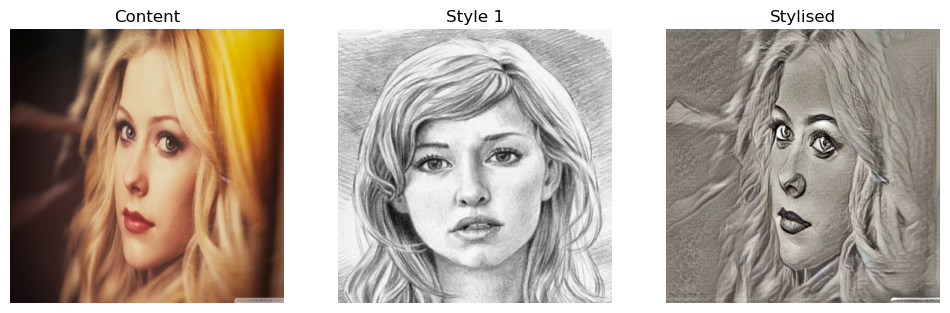

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.698, 2610.1322499962407)
Training at content: 3.0 and style: 40.0
Epoch: 1
[1000/20000] content=3.3898 style=6.0592 total=9.449022
[2000/20000] content=3.0584 style=3.1076 total=6.166010
[3000/20000] content=2.8921 style=2.7377 total=5.629773
[4000/20000] content=2.7528 style=2.5516 total=5.304441
[5000/20000] content=2.6530 style=2.5076 total=5.160523
[6000/20000] content=2.5111 style=2.2903 total=4.801340
[7000/20000] content=2.4244 style=2.2162 total=4.640623
[8000/20000] content=2.3593 style=2.0850 total=4.444245
[9000/20000] content=2.2787 style=1.9913 total=4.269991
[10000/20000] content=2.2396 style=2.0185 total=4.258143
[11000/20000] content=2.2101 style=1.9388 total=4.148868
[12000/20000] content=2.1964 style=1.9052 total=4.101571
[13000/20000] content=2.1683 style=1.8830 total=4.051270
[14000/20000] content=2.08

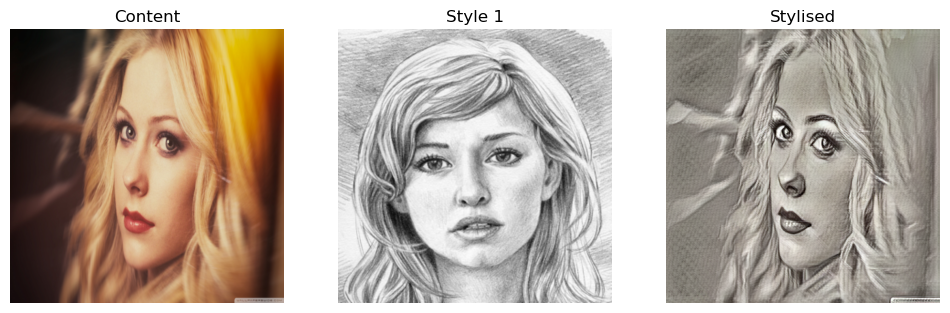

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.69, 3017.9432080039987)
Training at content: 3.0 and style: 50.0
Epoch: 1
[1000/20000] content=3.6461 style=7.1541 total=10.800274
[2000/20000] content=3.4183 style=4.2516 total=7.669963
[3000/20000] content=3.2564 style=3.5821 total=6.838539
[4000/20000] content=3.1856 style=3.3572 total=6.542790
[5000/20000] content=3.0526 style=3.1474 total=6.200008
[6000/20000] content=2.9947 style=3.0565 total=6.051190
[7000/20000] content=2.8726 style=2.8879 total=5.760499
[8000/20000] content=2.8278 style=2.7051 total=5.532878
[9000/20000] content=2.7612 style=2.5990 total=5.360188
[10000/20000] content=2.6608 style=2.6450 total=5.305839
[11000/20000] content=2.6473 style=2.4612 total=5.108550
[12000/20000] content=2.6058 style=2.4488 total=5.054557
[13000/20000] content=2.5611 style=2.3439 total=4.904937
[14000/20000] content=2.45

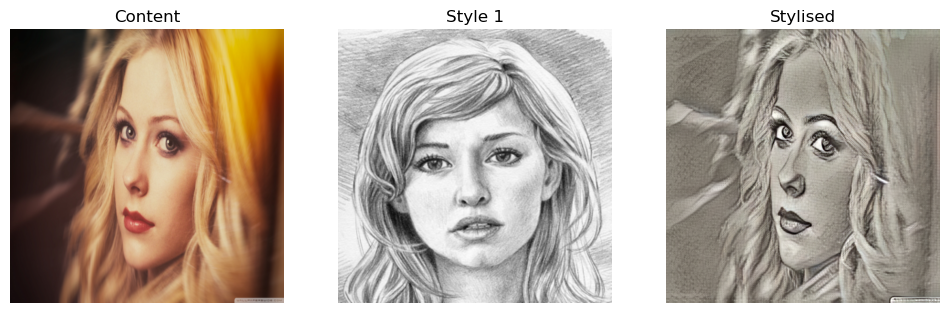

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.689, 2243.2397500087973)


In [19]:
#Parameter to Train
style_w= [40.0, 50.0]
content_w= [1.0, 2.0, 3.0]


# Training Complete
for cw in content_w:
    for sw in style_w:
        print(f"Training at content: {cw} and style: {sw}")
        model = AdaIN()
        model.uploadEncoder(encoder)
        model.epochTraining(train_content_loader, train_style_loader, f"res50_default_{int(cw)}_{int(sw)}", steps = 20000, epoch = 5, style_weight = sw, content_weight=cw)
        model.fit(image_path,[style_path])
        model.pipeline()
        model.displayImages()
        print(model.evaluate())

In [20]:
def layer2Reverse():
    return nn.Sequential(
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 512, 1),
        nn.ReLU(inplace=True), #relu 2-4
        
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 512, 1),
        nn.ReLU(inplace=True), #relu 2-3
        
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 512, 1),
        nn.ReLU(inplace=True), #relu 2-2
        
        nn.Upsample(scale_factor=2, mode="nearest"),
        
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 256, 1),
        nn.ReLU(inplace=True), #relu 2-1
        
        nn.Conv2d(256, 64, 1),
        nn.Conv2d(64, 64, 3, padding=1),
        nn.Conv2d(64, 256, 1),
        nn.ReLU(inplace=True), #relu 1-3
        
        nn.Conv2d(256, 64, 1),
        nn.Conv2d(64, 64, 3, padding=1),
        nn.Conv2d(64, 256, 1),
        nn.ReLU(inplace=True), #relu 1-2
        
        nn.Upsample(scale_factor=2, mode="nearest"),
        
        nn.Conv2d(256, 64, 1),
        nn.Conv2d(64, 64, 3, padding=1),
        nn.Conv2d(64, 64, 1),
        nn.ReLU(inplace=True), #relu 1-1
        
        nn.Conv2d(64, 3, 7, padding=3),
    )
#Training Complete
# neweDefaultModel = AdaIN()
# neweDefaultModel.uploadEncoder(encoder)
# neweDefaultModel.uploadDecoder(layer2Reverse())
# neweDefaultModel.epochTraining(train_content_loader, train_style_loader, "res50_default_new_decoder", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0)
# neweDefaultModel.fit(image_path,[style_path])
# neweDefaultModel.pipeline()
# neweDefaultModel.displayImages()
# neweDefaultModel.evaluate()

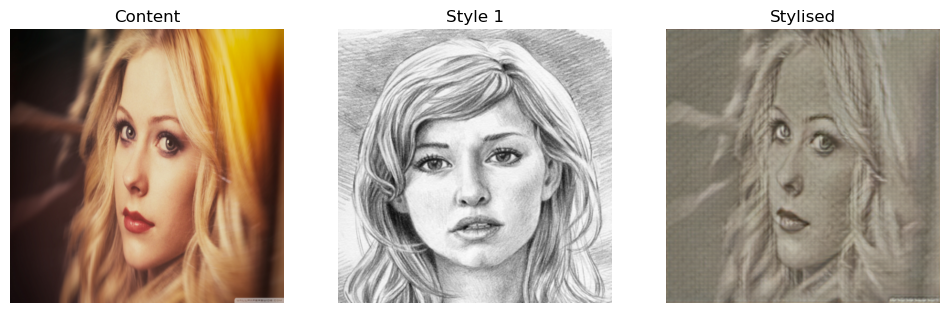

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.696, 99.06829199462663)

In [21]:
neweDefaultModel = AdaIN(prebuild_decoder = "res50_default_new_decoder_5.pth")
neweDefaultModel.uploadEncoder(encoder)
neweDefaultModel.uploadDecoder(layer2Reverse())
neweDefaultModel.setup()
neweDefaultModel.fit(image_path,[style_path])
neweDefaultModel.pipeline()
neweDefaultModel.displayImages()
neweDefaultModel.evaluate()

In [22]:
encoderL3 = nn.Sequential(*list(resnet.children())[:7])
def layer3Reverse():
    return nn.Sequential(
        nn.Conv2d(1024, 256, 1),
        nn.Conv2d(256, 256, 3, padding=1),
        nn.Conv2d(256, 1024, 1),
        nn.ReLU(inplace=True), #relu 3-6
        
        nn.Conv2d(1024, 256, 1),
        nn.Conv2d(256, 256, 3, padding=1),
        nn.Conv2d(256, 1024, 1),
        nn.ReLU(inplace=True), #relu 3-5
        
        nn.Conv2d(1024, 256, 1),
        nn.Conv2d(256, 256, 3, padding=1),
        nn.Conv2d(256, 1024, 1),
        nn.ReLU(inplace=True), #relu 3-4
        
        nn.Conv2d(1024, 256, 1),
        nn.Conv2d(256, 256, 3, padding=1),
        nn.Conv2d(256, 1024, 1),
        nn.ReLU(inplace=True), #relu 3-3

        nn.Conv2d(1024, 256, 1),
        nn.Conv2d(256, 256, 3, padding=1),
        nn.Conv2d(256, 1024, 1),
        nn.ReLU(inplace=True), #relu 3-2
        
        nn.Upsample(scale_factor=2, mode="nearest"),
        
        nn.Conv2d(1024, 256, 1),
        nn.Conv2d(256, 256, 3, padding=1),
        nn.Conv2d(256, 512, 1),
        nn.ReLU(inplace=True), #relu 3-1
        
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 512, 1),
        nn.ReLU(inplace=True), #relu 2-4
        
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 512, 1),
        nn.ReLU(inplace=True), #relu 2-3
        
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 512, 1),
        nn.ReLU(inplace=True), #relu 2-2
        
        nn.Upsample(scale_factor=2, mode="nearest"),
        
        nn.Conv2d(512, 128, 1),
        nn.Conv2d(128, 128, 3, padding=1),
        nn.Conv2d(128, 256, 1),
        nn.ReLU(inplace=True), #relu 2-1
        
        nn.Conv2d(256, 64, 1),
        nn.Conv2d(64, 64, 3, padding=1),
        nn.Conv2d(64, 256, 1),
        nn.ReLU(inplace=True), #relu 1-3
        
        nn.Conv2d(256, 64, 1),
        nn.Conv2d(64, 64, 3, padding=1),
        nn.Conv2d(64, 256, 1),
        nn.ReLU(inplace=True), #relu 1-2
        
        nn.Upsample(scale_factor=2, mode="nearest"),
        
        nn.Conv2d(256, 64, 1),
        nn.Conv2d(64, 64, 3, padding=1),
        nn.Conv2d(64, 64, 1),
        nn.ReLU(inplace=True), #relu 1-1
        
        nn.Conv2d(64, 3, 7, padding=3),
    )
#Training complete
# neweL3Model = AdaIN()
# neweL3Model.uploadEncoder(encoderL3)
# neweL3Model.uploadDecoder(layer3Reverse())
# neweL3Model.epochTraining(train_content_loader, train_style_loader, "res50_L3_new_decoder", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0)
# neweL3Model.fit(image_path,[style_path])
# neweL3Model.pipeline()
# neweL3Model.displayImages()
# neweL3Model.evaluate()

In [23]:
neweL3Model = AdaIN(prebuild_decoder = "res50_L3_new_decoder_5.pth")
neweL3Model.uploadEncoder(encoderL3)
neweL3Model.uploadDecoder(layer3Reverse())
newL3Model.setup()
neweL3Model.fit(image_path,[style_path])
neweL3Model.pipeline()
neweL3Model.displayImages()
neweL3Model.evaluate()

NameError: name 'newL3Model' is not defined